In [14]:
import os
import numpy as np

PATH = "/home/mario/Python/Datasets/EEG/RQA"

data = {}
for path in os.listdir(PATH):
    channel = path.split("_")[2]
    npz_files = [os.path.join(PATH, path, f) for f in os.listdir(os.path.join(PATH, path)) if f.endswith(".npz")]
    data[channel] = {}
    data[channel]["paths"] = {}
    data[channel]["data"] = {}
    for f in npz_files:
        base = os.path.basename(f)
        for input_type in ["DD_DOWN", "DD_UP", "CT_DOWN", "CT_UP"]:
            if base.startswith(input_type):
                data[channel]["paths"][input_type] = f
                data[channel]["data"][input_type] = np.load(f)
    
display(data)

{'Fz': {'paths': {'DD_UP': '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_202309/DD_UP_Fz_rqe_results.npz',
   'CT_DOWN': '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_202309/CT_DOWN_Fz_rqe_results.npz',
   'CT_UP': '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_202309/CT_UP_Fz_rqe_results.npz',
   'DD_DOWN': '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_202309/DD_DOWN_Fz_rqe_results.npz'},
  'data': {'DD_UP': NpzFile '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_202309/DD_UP_Fz_rqe_results.npz' with keys: rqa_metrics, rqe_values, corr_values,
   'CT_DOWN': NpzFile '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_202309/CT_DOWN_Fz_rqe_results.npz' with keys: rqa_metrics, rqe_values, corr_values,
   'CT_UP': NpzFile '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_202309/CT_UP_Fz_rqe_results.npz' with keys: rqa_metrics, rqe_values, corr_values,
   'DD_DOWN': NpzFile '/home/mario/Python/Datasets/EEG/RQA/rqa_ch_Fz_20250324_2023

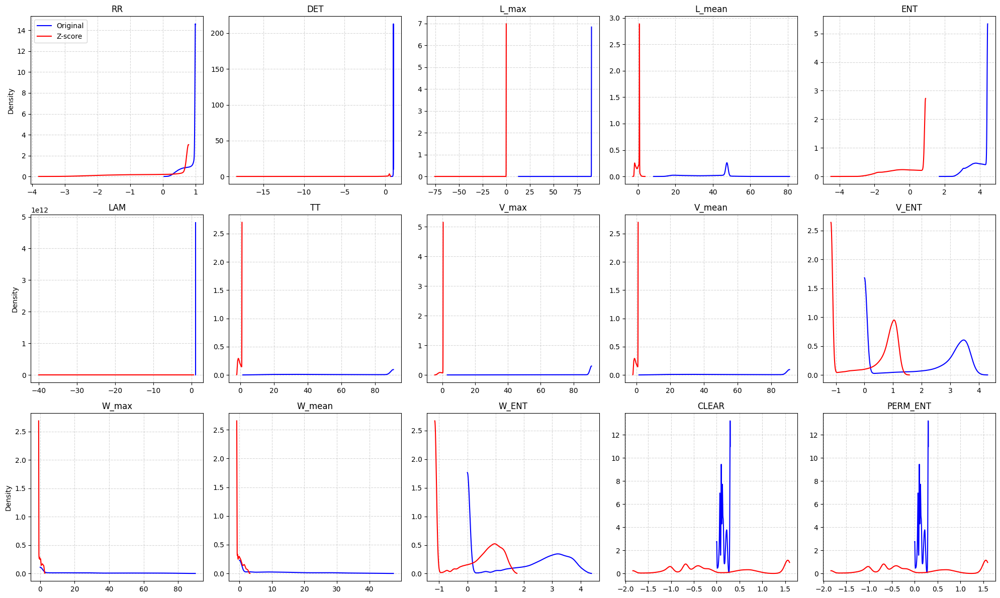

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
from scipy.stats import gaussian_kde

# Access the RQA metrics data
rqa_data = data["Fz"]["data"]["CT_UP"]["rqa_metrics"]

# Define metric names
metric_names = [
    "RR", "DET", "L_max", "L_mean", "ENT", 
    "LAM", "TT", "V_max", "V_mean", "V_ENT", 
    "W_max", "W_mean", "W_ENT", "CLEAR", "PERM_ENT"
]

# Create subplots - one for each metric
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

for i, (ax, name) in enumerate(zip(axes, metric_names)):
    # Extract and flatten metric data
    metric_values = rqa_data[..., i].flatten()
    
    # Calculate z-score normalized values
    z_normalized = stats.zscore(metric_values, nan_policy='omit')
    
    # Compute KDE for original values
    kde_original = gaussian_kde(metric_values)
    x_original = np.linspace(min(metric_values), max(metric_values), 1000)
    
    # Compute KDE for normalized values
    kde_normalized = gaussian_kde(z_normalized)
    x_normalized = np.linspace(min(z_normalized), max(z_normalized), 1000)
    
    # Plot both KDEs
    ax.plot(x_original, kde_original(x_original), 'b-', label='Original')
    ax.plot(x_normalized, kde_normalized(x_normalized), 'r-', label='Z-score')
    
    ax.set_title(name)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Set y-label only for leftmost plots
    if i % 5 == 0:
        ax.set_ylabel('Density')
    
    # Add legend only to the first plot
    if i == 0:
        ax.legend()

plt.tight_layout()
plt.show()

In [2]:
# Ensure required packages are installed

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
plt.style.use(['science', 'notebook'])

PATH = "/home/mariopasc/Python/Datasets/EEG/timeseries/processed/rqe/rqe_ch_T7_20250317_214421"
files = [os.path.join(PATH, f) for f in os.listdir(PATH) if f.endswith(".npz")]
metrics_to_use = ["RR", "DET", "L_max", "L_mean", "ENT", "LAM", "TT", "V_max", "V_mean", "V_ENT", "W_max", "W_mean", "W_ENT", "CLEAR", "PERM_ENT"]
display(files)
savepath_assets= "/home/mariopasc/Python/Projects/Dyslexia_EEG_characterization/docs/assets/rqe/correlations"

['/home/mariopasc/Python/Datasets/EEG/timeseries/processed/rqe/rqe_ch_T7_20250317_214421/CT_UP_T7_rqe_results.npz',
 '/home/mariopasc/Python/Datasets/EEG/timeseries/processed/rqe/rqe_ch_T7_20250317_214421/DD_DOWN_T7_rqe_results.npz',
 '/home/mariopasc/Python/Datasets/EEG/timeseries/processed/rqe/rqe_ch_T7_20250317_214421/DD_UP_T7_rqe_results.npz',
 '/home/mariopasc/Python/Datasets/EEG/timeseries/processed/rqe/rqe_ch_T7_20250317_214421/CT_DOWN_T7_rqe_results.npz']

In [3]:
# Load a data file
data = np.load(files[0], allow_pickle=True)

# Function to safely print array information
def inspect_array(arr, name, max_shape_dims=5):
    print(f"\n=== {name} ===")
    print(f"Type: {type(arr)}")
    
    if isinstance(arr, np.ndarray):
        print(f"Shape: {arr.shape}")
        print(f"Data type: {arr.dtype}")
        
        # Print array dimensions meaning if we recognize the shape
        if name == "rqa_metrics" and len(arr.shape) == 5:
            dims = ["patients", "channels", "bands", "windows", "metrics"]
            print("Dimensions: " + ", ".join([f"{dims[i]}={s}" for i, s in enumerate(arr.shape)]))
        
        # Sample values
        if arr.size > 0:
            try:
                if arr.dtype.kind in 'UOS':  # string or object
                    print(f"First few elements: {arr.flatten()[:3]}")
                else:
                    print(f"Min: {np.nanmin(arr)}, Max: {np.nanmax(arr)}, Mean: {np.nanmean(arr)}")
                    print(f"NaN count: {np.isnan(arr).sum()} out of {arr.size} elements")
            except Exception as e:
                print(f"Could not compute statistics: {e}")
    
    elif isinstance(arr, dict):
        print(f"Dictionary with {len(arr)} keys: {list(arr.keys())}")
        # Show sample of dictionary content
        for k, v in list(arr.items())[:3]:
            print(f"  - {k}: {type(v)}")
    
    else:
        try:
            print(f"Value: {arr}")
        except:
            print("Value could not be displayed")

# Inspect each key
for key in data.keys():
    try:
        if key == "rqa_params" or key == "channel_metadata" or key == "normalize_metrics":
            # Convert to Python object if possible
            try:
                value = data[key].item()
                inspect_array(value, key)
            except:
                inspect_array(data[key], key)
        else:
            inspect_array(data[key], key)
    except Exception as e:
        print(f"Error inspecting {key}: {e}")

# If metrics are available, show the mapping between index positions and metric names
if "rqa_params" in data and "rqa_metrics" in data:
    metrics = data["rqa_params"].item().get("metrics_to_use", [])
    print("\n=== RQA Metrics Column Mapping ===")
    for i, metric in enumerate(metrics):
        print(f"Column {i}: {metric}")
        
    # Create a sample slice to demonstrate how to access specific metrics
    print("\n=== Example: Accessing specific metrics ===")
    rqa_data = data["rqa_metrics"]
    patient_idx = 0
    channel_idx = 0
    band_idx = 0
    window_idx = 0
    
    print(f"For patient {patient_idx}, channel {channel_idx}, band {band_idx}, window {window_idx}:")
    for i, metric in enumerate(metrics):
        value = rqa_data[patient_idx, channel_idx, band_idx, window_idx, i]
        print(f"  {metric}: {value}")


=== rqa_metrics ===
Type: <class 'numpy.ndarray'>
Shape: (34, 1, 5, 9701, 15)
Data type: float64
Dimensions: patients=34, channels=1, bands=5, windows=9701, metrics=15
Min: 0.0, Max: 91.0, Mean: 4.8119437490788135
NaN count: 0 out of 24737550 elements

=== rqe_values ===
Type: <class 'numpy.ndarray'>
Shape: (34, 1, 5, 9677)
Data type: float64
Min: 1.0, Max: 1.0062879009909566e+30, Mean: 3.381230185427911e+25
NaN count: 0 out of 1645090 elements

=== corr_values ===
Type: <class 'numpy.ndarray'>
Shape: (34, 1, 5, 9677)
Data type: float64
Min: 0.0, Max: 1.0, Mean: 0.699593152443002
NaN count: 0 out of 1645090 elements

=== rqa_params ===
Type: <class 'dict'>
Dictionary with 10 keys: ['embedding_dim', 'radius', 'time_delay', 'raw_signal_window_size', 'rqa_space_window_size', 'min_diagonal_line', 'min_vertical_line', 'min_white_vertical_line', 'stride', 'metrics_to_use']
  - embedding_dim: <class 'int'>
  - radius: <class 'float'>
  - time_delay: <class 'int'>

=== normalize_metrics ===
T

## Evolution visualization

Loading /home/mariopasc/Python/Datasets/EEG/timeseries/processed/rqe/rqe_ch_T7_20250317_214421/CT_UP_T7_rqe_results.npz
 and /home/mariopasc/Python/Datasets/EEG/timeseries/processed/rqe/rqe_ch_T7_20250317_214421/DD_UP_T7_rqe_results.npz


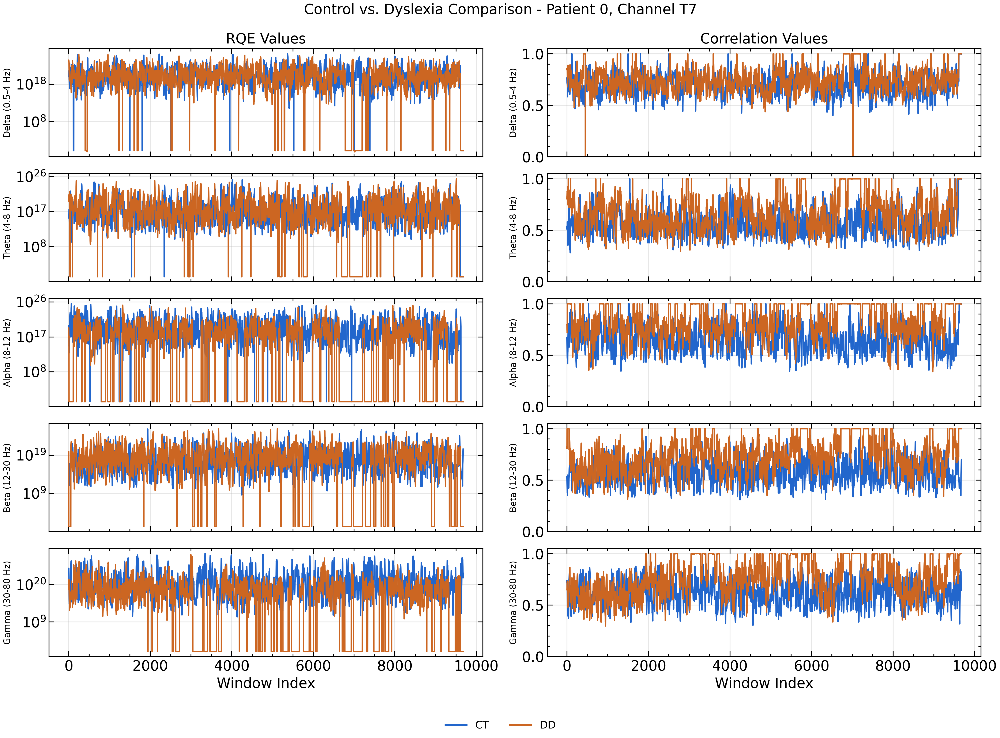

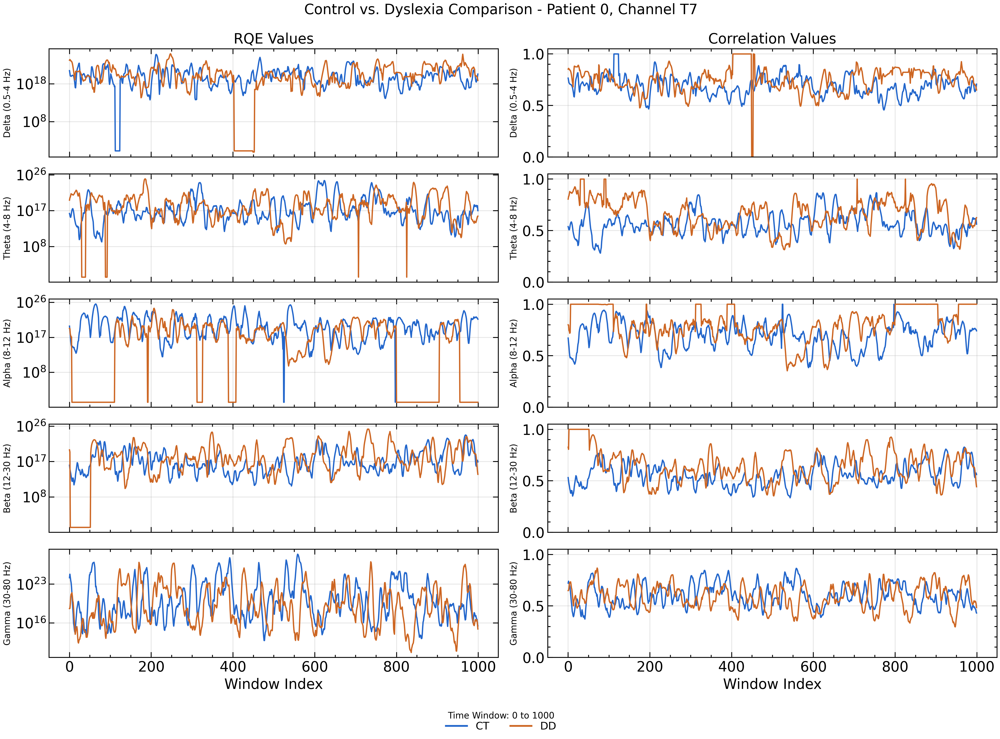

In [4]:
def plot_compare_groups(data_dict, patient_idx=0, channel_idx=0, 
                       band_names=None, time_window=None, 
                       figsize=(16, 12)):
    """
    Plot RQE values and correlation values comparing control vs. dyslexia patients.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with keys 'CT' and 'DD' containing the data for each group
    patient_idx : int
        Index of the patient to plot
    channel_idx : int
        Index of the channel to plot (should be 0 for T7)
    band_names : list of str
        Names of the frequency bands
    time_window : tuple or None
        Optional (start, end) indices to plot a subset of the data
    figsize : tuple
        Figure size
    """
    if band_names is None:
        band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    n_bands = data_dict["CT"]["rqe_values"].shape[2]
    
    # Create figure with two columns of subplots
    fig, axes = plt.subplots(n_bands, 2, figsize=figsize, sharex=True)
    
    # Set a title for the entire figure
    fig.suptitle(f'Control vs. Dyslexia Comparison - Patient {patient_idx}, Channel T7', 
                 fontsize=16)
    
    # Group colors
    group_colors = {
        "CT": "#2266CC",  # Blue for control
        "DD": "#CC6622"   # Orange for dyslexia
    }
    
    # Band colors for line styles or markers
    band_styles = {
        "Delta (0.5-4 Hz)": "-",
        "Theta (4-8 Hz)": "-",
        "Alpha (8-12 Hz)": "-",
        "Beta (12-30 Hz)": "-",
        "Gamma (30-80 Hz)": "-"
    }
    
    # Plot each band
    for band_idx, band_name in enumerate(band_names[:n_bands]):
        # Get axes for this band
        ax_rqe = axes[band_idx, 0]
        ax_corr = axes[band_idx, 1]
        
        # Plot data for each group
        for group_name, data in data_dict.items():
            # Get data
            rqe_values = data["rqe_values"][patient_idx, channel_idx, band_idx, :]
            corr_values = data["corr_values"][patient_idx, channel_idx, band_idx, :]
            
            # Apply time window if specified
            if time_window is not None:
                start, end = time_window
                x_axis = np.arange(start, min(end, len(rqe_values)))
                rqe_values = rqe_values[start:end]
                corr_values = corr_values[start:end]
            else:
                x_axis = np.arange(len(rqe_values))
            
            # Plot RQE values
            line_style = band_styles[band_name]
            if np.max(rqe_values) > 1000:
                ax_rqe.semilogy(x_axis, rqe_values, linestyle=line_style, 
                               color=group_colors[group_name], linewidth=1.5,
                               label=f"{group_name} {band_name}")
            else:
                ax_rqe.plot(x_axis, rqe_values, linestyle=line_style,
                           color=group_colors[group_name], linewidth=1.5,
                           label=f"{group_name} {band_name}")
                
            # Plot correlation values
            ax_corr.plot(x_axis, corr_values, linestyle=line_style,
                        color=group_colors[group_name], linewidth=1.5,
                        label=f"{group_name} {band_name}")
        
        # Set labels and formatting
        ax_rqe.set_ylabel(f'{band_name}', fontsize=10)
        ax_rqe.grid(True, alpha=0.3)
        
        ax_corr.set_ylabel(f'{band_name}', fontsize=10)
        ax_corr.grid(True, alpha=0.3)
        ax_corr.set_ylim(0, 1.05)
        
        # Add titles on first row only
        if band_idx == 0:
            ax_rqe.set_title('RQE Values')
            ax_corr.set_title('Correlation Values')
    
    # Add x-axis labels
    axes[-1, 0].set_xlabel('Window Index')
    axes[-1, 1].set_xlabel('Window Index')
    
    # Create legend for groups
    handles, labels = [], []
    for group_name, color in group_colors.items():
        handles.append(plt.Line2D([0], [0], color=color, linewidth=2))
        labels.append(group_name)
    
    # Add a legend for groups at the bottom
    fig.legend(handles, labels, loc='lower center', ncol=2, 
               bbox_to_anchor=(0.5, 0.01), fontsize=12)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        fig.text(0.5, 0.04, f'Time Window: {start} to {end}', ha='center', fontsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92, bottom=0.12)
    return fig

# Load both datasets
print(f"Loading {files[0]}\n and {files[2]}")
ct_data = np.load(files[0], allow_pickle=True)
dd_data = np.load(files[2], allow_pickle=True) 

# Create data dictionary
data_dict = {
    "CT": ct_data,
    "DD": dd_data
}

# Plot comparison for a specific patient
fig_comparison = plot_compare_groups(data_dict, patient_idx=0, channel_idx=0)
plt.show()

# You can also specify a time window
fig_window = plot_compare_groups(data_dict, patient_idx=0, channel_idx=0, 
                               time_window=(0, 1000))
plt.savefig(os.path.join(savepath_assets, 'rqe_per_band_comparison_ct_dd.svg'), format='svg', bbox_inches='tight', dpi=300)

plt.show()




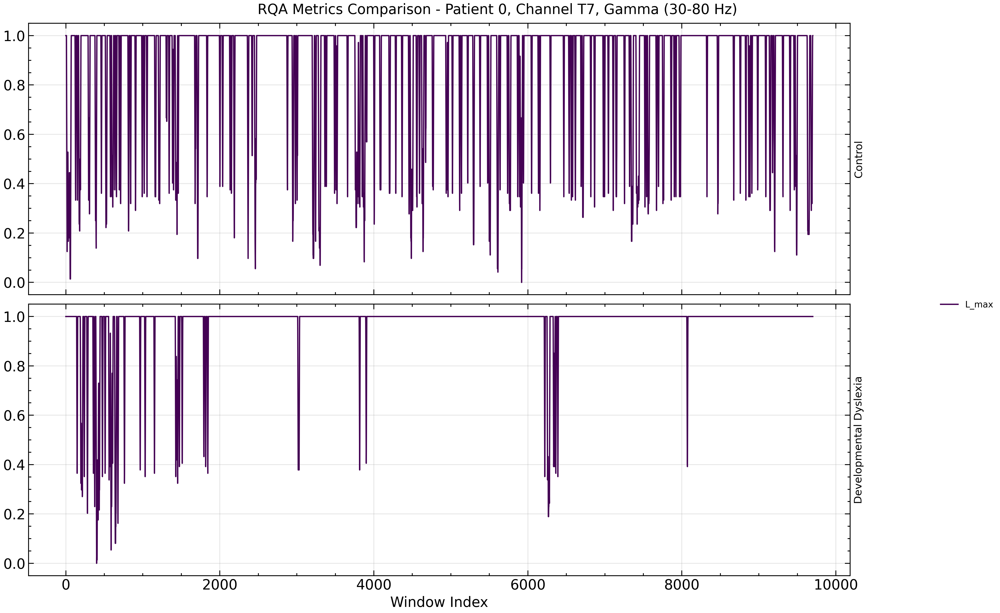

In [5]:
def plot_rqa_metrics_comparison(data_dict, metrics_to_plot, patient_idx=0, channel_idx=0, 
                               band_idx=0, time_window=None, figsize=(16, 10)):
    """
    Plot selected RQA metrics for Control vs. Dyslexia groups.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with keys 'CT' and 'DD' containing the data for each group
    metrics_to_plot : list
        List of metric names to plot
    patient_idx : int
        Index of the patient to plot
    channel_idx : int
        Index of the channel to plot (should be 0 for T7)
    band_idx : int
        Index of the frequency band to plot
    time_window : tuple or None
        Optional (start, end) indices to plot a subset of the data
    figsize : tuple
        Figure size
    """
    band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    # Create figure with two rows of subplots (one for each group)
    fig, axes = plt.subplots(2, 1, figsize=figsize, sharex=True)
    
    # Set a title for the entire figure
    fig.suptitle(f'RQA Metrics Comparison - Patient {patient_idx}, Channel T7, {band_names[band_idx]}', 
                fontsize=16)
    
    # Get all available metrics from data
    all_metrics = data_dict["CT"]["rqa_params"].item().get("metrics_to_use", [])
    
    # Get indices of metrics to plot
    metric_indices = [all_metrics.index(metric) for metric in metrics_to_plot if metric in all_metrics]
    
    # Create colormap for metrics
    cmap = plt.cm.viridis
    colors = cmap(np.linspace(0, 1, len(metric_indices)))
    
    # Group labels
    group_labels = {"CT": "Control", "DD": "Developmental Dyslexia"}
    
    # Plot for each group
    for i, (group_name, data) in enumerate(data_dict.items()):
        ax = axes[i]
        
        # Get RQA metrics data
        rqa_data = data["rqa_metrics"][patient_idx, channel_idx, band_idx, :, :]
        
        # Apply time window if specified
        if time_window is not None:
            start, end = time_window
            x_axis = np.arange(start, min(end, rqa_data.shape[0]))
            rqa_data = rqa_data[start:end, :]
        else:
            x_axis = np.arange(rqa_data.shape[0])
        
        # Plot each selected metric
        for j, metric_idx in enumerate(metric_indices):
            metric_name = all_metrics[metric_idx]
            metric_values = rqa_data[:, metric_idx]
            
            ax.plot(x_axis, metric_values, color=colors[j], linewidth=1.5,
                   label=metric_name)
        
        # Set labels and formatting
        ax.set_ylabel(f'{group_labels[group_name]}', fontsize=12)
        ax.grid(True, alpha=0.3)
        
        # Add y-label on the right side
        ax.yaxis.set_label_position("right")
    
    # Add x-axis label to bottom plot
    axes[-1].set_xlabel('Window Index')
    
    # Create legend for metrics and place it outside
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1.0, 0.5), fontsize=10)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        fig.text(0.44, 0.001, f'Time Window: {start} to {end}', ha='center', fontsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(right=0.85)  # Make room for the legend
    return fig

# Example usage
metrics_to_plot = metrics_to_use

# Plot for a specific band
fig_band0 = plot_rqa_metrics_comparison(
    data_dict, 
    metrics_to_plot=["L_max"],
    patient_idx=0, 
    channel_idx=0,
    band_idx=4, 
)
plt.show()


## Correlations

Group CT: Processed 34 valid patients out of 34
Group DD: Processed 15 valid patients out of 15


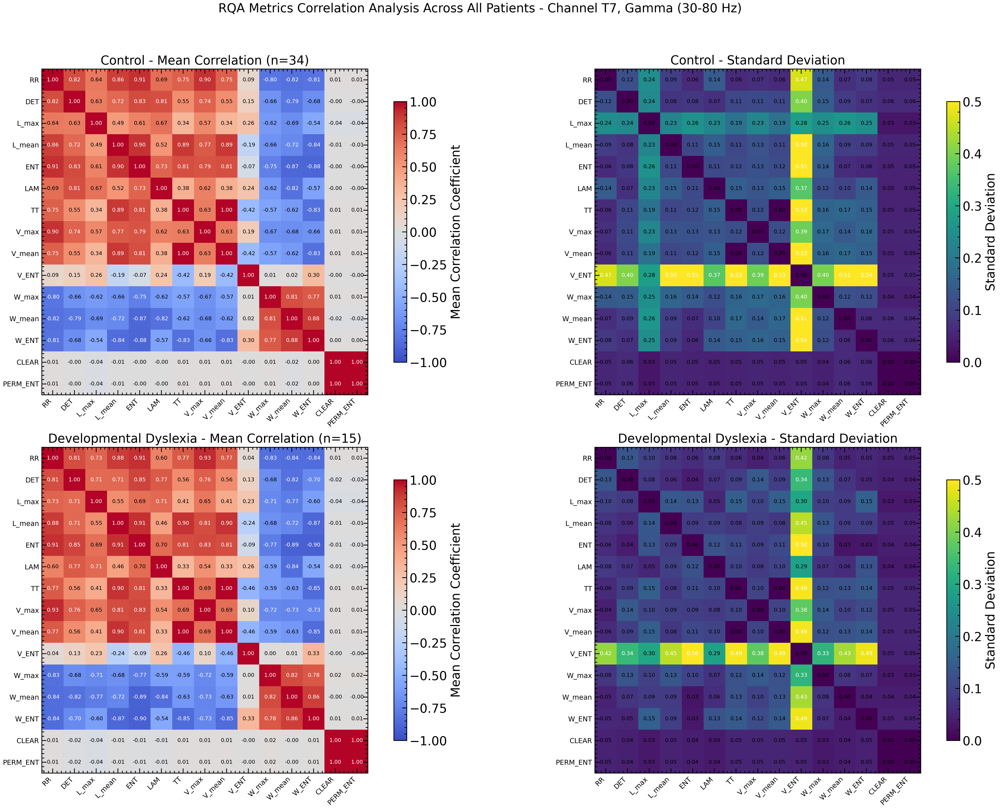

In [6]:
def analyze_rqa_metrics_correlation_across_patients(data_dict, channel_idx=0, 
                                                   band_idx=0, time_window=None, 
                                                   figsize=(20, 15)):
    """
    Analyze and visualize correlations between RQA metrics across all patients.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with keys 'CT' and 'DD' containing the data for each group
    channel_idx : int
        Index of the channel to analyze (should be 0 for T7)
    band_idx : int
        Index of the frequency band to analyze
    time_window : tuple or None
        Optional (start, end) indices for a subset of the data
    figsize : tuple
        Figure size
    """
    band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    # Get all metrics
    all_metrics = data_dict["CT"]["rqa_params"].item().get("metrics_to_use", [])
    n_metrics = len(all_metrics)
    
    # Group labels
    group_labels = {"CT": "Control", "DD": "Developmental Dyslexia"}
    
    # Create a figure with 2 rows (one for each group) and 2 columns (mean and std)
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    
    # Set a title for the entire figure
    fig.suptitle(f'RQA Metrics Correlation Analysis Across All Patients - Channel T7, {band_names[band_idx]}', 
                fontsize=16)
    
    # Process each group
    for group_idx, (group_name, data) in enumerate(data_dict.items()):
        # Get number of patients
        n_patients = data["rqa_metrics"].shape[0]
        
        # Initialize arrays to store correlation matrices for all patients
        all_corr_matrices = []  # Use a list instead of array to handle variable data
        valid_patients = 0
        
        # Process each patient
        for patient_idx in range(n_patients):
            try:
                # Get RQA metrics data for this patient
                rqa_data = data["rqa_metrics"][patient_idx, channel_idx, band_idx, :, :]
                
                # Apply time window if specified
                if time_window is not None:
                    start, end = time_window
                    rqa_data = rqa_data[start:min(end, rqa_data.shape[0]), :]
                
                # Check if we have enough data
                if rqa_data.shape[0] < 5:  # Need at least a few points for correlation
                    print(f"Skipping patient {patient_idx} in group {group_name}: insufficient data")
                    continue
                
                # Create a DataFrame with all metrics
                df = pd.DataFrame(rqa_data, columns=all_metrics)
                
                # Check for constant columns (which cause NaN correlations)
                const_cols = df.columns[df.nunique() <= 1]
                if len(const_cols) > 0:
                    print(f"Warning: Patient {patient_idx} in group {group_name} has constant metrics: {list(const_cols)}")
                    # Either drop constant columns or add tiny noise
                    for col in const_cols:
                        df[col] = df[col] + np.random.normal(0, 1e-10, size=len(df))
                
                # Calculate correlation matrix
                corr_matrix = df.corr().values
                
                # Check for NaN values
                if np.isnan(corr_matrix).any():
                    print(f"Warning: NaN correlations for patient {patient_idx} in group {group_name}")
                    # Replace NaNs with zeros (neutral correlation)
                    corr_matrix = np.nan_to_num(corr_matrix, nan=0.0)
                
                # Store in our list
                all_corr_matrices.append(corr_matrix)
                valid_patients += 1
                
            except Exception as e:
                print(f"Error processing patient {patient_idx} in group {group_name}: {str(e)}")
        
        print(f"Group {group_name}: Processed {valid_patients} valid patients out of {n_patients}")
        
        if valid_patients == 0:
            print(f"No valid data for group {group_name}!")
            # Fill with zeros to avoid errors
            mean_corr = np.zeros((n_metrics, n_metrics))
            std_corr = np.zeros((n_metrics, n_metrics))
        else:
            # Convert list to array
            all_corr_matrices_array = np.array(all_corr_matrices)
            
            # Calculate mean and standard deviation across patients
            mean_corr = np.mean(all_corr_matrices_array, axis=0)
            std_corr = np.std(all_corr_matrices_array, axis=0)
        
        # Plot mean correlation
        ax_mean = axes[group_idx, 0]
        im_mean = ax_mean.imshow(mean_corr, cmap='coolwarm', vmin=-1, vmax=1)
        ax_mean.set_title(f'{group_labels[group_name]} - Mean Correlation (n={valid_patients})')
        
        # Add colorbar
        cbar_mean = plt.colorbar(im_mean, ax=ax_mean, shrink=0.8)
        cbar_mean.set_label('Mean Correlation Coefficient')
        
        # Plot standard deviation
        ax_std = axes[group_idx, 1]
        im_std = ax_std.imshow(std_corr, cmap='viridis', vmin=0, vmax=0.5)
        ax_std.set_title(f'{group_labels[group_name]} - Standard Deviation')
        
        # Add colorbar
        cbar_std = plt.colorbar(im_std, ax=ax_std, shrink=0.8)
        cbar_std.set_label('Standard Deviation')
        
        # Set ticks and labels for all subplots
        for ax in [ax_mean, ax_std]:
            ax.set_xticks(np.arange(len(all_metrics)))
            ax.set_yticks(np.arange(len(all_metrics)))
            ax.set_xticklabels(all_metrics, rotation=45, ha='right', fontsize=9)
            ax.set_yticklabels(all_metrics, fontsize=9)
        
        # Add text annotations for mean correlation
        for i in range(n_metrics):
            for j in range(n_metrics):
                color = 'white' if abs(mean_corr[i, j]) > 0.7 else 'black'
                ax_mean.text(j, i, f"{mean_corr[i, j]:.2f}",
                           ha="center", va="center", color=color, fontsize=7)
        
        # Add text annotations for standard deviation
        for i in range(n_metrics):
            for j in range(n_metrics):
                color = 'white' if std_corr[i, j] > 0.3 else 'black'
                ax_std.text(j, i, f"{std_corr[i, j]:.2f}",
                          ha="center", va="center", color=color, fontsize=7)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        fig.text(0.5, 0.01, f'Time Window: {start} to {end}', ha='center', fontsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    
    return fig

# Function to create a statistical significance map of correlation differences
def analyze_correlation_differences(data_dict, channel_idx=0, band_idx=0, 
                                  time_window=None, figsize=(12, 10)):
    """
    Analyze statistically significant differences in correlations between control and dyslexia groups.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with keys 'CT' and 'DD' containing the data for each group
    channel_idx : int
        Index of the channel to analyze
    band_idx : int
        Index of the frequency band to analyze
    time_window : tuple or None
        Optional time window
    figsize : tuple
        Figure size
    """
    band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    # Get all metrics
    all_metrics = data_dict["CT"]["rqa_params"].item().get("metrics_to_use", [])
    n_metrics = len(all_metrics)
    
    # Create arrays to store correlation matrices for all patients in each group
    corr_arrays = {}
    valid_patients = {}
    
    # Process each group
    for group_name, data in data_dict.items():
        # Get number of patients
        n_pts = data["rqa_metrics"].shape[0]
        
        # Initialize list for this group
        corr_arrays[group_name] = []
        valid_patients[group_name] = 0
        
        # Process each patient
        for patient_idx in range(n_pts):
            try:
                # Get RQA metrics data
                rqa_data = data["rqa_metrics"][patient_idx, channel_idx, band_idx, :, :]
                
                # Apply time window if specified
                if time_window is not None:
                    start, end = time_window
                    rqa_data = rqa_data[start:min(end, rqa_data.shape[0]), :]
                
                # Check if we have enough data
                if rqa_data.shape[0] < 5:
                    continue
                
                # Create DataFrame
                df = pd.DataFrame(rqa_data, columns=all_metrics)
                
                # Check for constant columns
                const_cols = df.columns[df.nunique() <= 1]
                if len(const_cols) > 0:
                    # Add tiny noise to constant columns
                    for col in const_cols:
                        df[col] = df[col] + np.random.normal(0, 1e-10, size=len(df))
                
                # Calculate correlation matrix
                corr_matrix = df.corr().values
                
                # Check for NaN values
                if np.isnan(corr_matrix).any():
                    # Fill NaN values with zeros
                    corr_matrix = np.nan_to_num(corr_matrix, nan=0.0)
                
                # Store in our list
                corr_arrays[group_name].append(corr_matrix)
                valid_patients[group_name] += 1
                
            except Exception as e:
                print(f"Error processing patient {patient_idx} in group {group_name}: {str(e)}")
        
        print(f"Group {group_name}: Processed {valid_patients[group_name]} valid patients")
    
    # Check if we have enough data for comparison
    for group_name in ["CT", "DD"]:
        if valid_patients[group_name] < 2:
            print(f"Not enough valid patients for group {group_name} to perform statistical comparison")
            return None
    
    # Convert lists to arrays
    ct_corrs = np.array(corr_arrays["CT"])
    dd_corrs = np.array(corr_arrays["DD"])
    
    # Calculate mean difference
    mean_ct = np.mean(ct_corrs, axis=0)
    mean_dd = np.mean(dd_corrs, axis=0)
    mean_diff = mean_ct - mean_dd
    
    # Initialize p-value matrix
    p_values = np.ones((n_metrics, n_metrics))
    
    # Calculate p-values for each correlation pair
    for i in range(n_metrics):
        for j in range(n_metrics):
            # Extract correlation values for this pair from both groups
            ct_vals = ct_corrs[:, i, j]
            dd_vals = dd_corrs[:, i, j]
            
            # Skip if no variation (would cause division by zero in t-test)
            if np.std(ct_vals) < 1e-10 or np.std(dd_vals) < 1e-10:
                continue
            
            # Perform t-test
            try:
                _, p_val = ttest_ind(ct_vals, dd_vals, equal_var=False)
                p_values[i, j] = p_val
            except Exception as e:
                print(f"Error in t-test for metrics {all_metrics[i]} and {all_metrics[j]}: {str(e)}")
    
    # Create figure
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Plot mean difference
    im1 = ax1.imshow(mean_diff, cmap='coolwarm', vmin=-0.5, vmax=0.5)
    ax1.set_title(f'Mean Correlation Difference\n(Control - Dyslexia)')
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
    cbar1.set_label('Difference in Correlation')
    
    # Plot p-values with significance levels
    # -log10(p) for better visualization (higher = more significant)
    log_p = -np.log10(p_values)
    # Cap the values for better visualization
    log_p = np.minimum(log_p, 4)  # Cap at p=0.0001 or -log10(0.0001)=4
    
    im2 = ax2.imshow(log_p, cmap='viridis', vmin=0, vmax=4)
    ax2.set_title(f'Statistical Significance\n(-log10(p-value))')
    cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8)
    cbar2.set_label('-log10(p-value)')
    
    # Add significance level markers
    # Add contours at p=0.05, p=0.01, and p=0.001
    significance_levels = [0.05, 0.01, 0.001]
    colors = ['white', 'yellow', 'red']
    
    for level, color in zip(significance_levels, colors):
        # Create mask for this significance level
        mask = p_values <= level
        
        # Add contour
        for i in range(n_metrics):
            for j in range(n_metrics):
                if mask[i, j]:
                    rect = plt.Rectangle((j-0.5, i-0.5), 1, 1, fill=False, 
                                         edgecolor=color, linewidth=1, alpha=0.7)
                    ax2.add_patch(rect)
    
    # Add custom legend for significance levels
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='none', edgecolor='white', label='p ≤ 0.05'),
        Patch(facecolor='none', edgecolor='yellow', label='p ≤ 0.01'),
        Patch(facecolor='none', edgecolor='red', label='p ≤ 0.001')
    ]
    ax2.legend(handles=legend_elements, loc='upper right', fontsize=9)
    
    # Set ticks and labels for all subplots
    for ax in [ax1, ax2]:
        ax.set_xticks(np.arange(len(all_metrics)))
        ax.set_yticks(np.arange(len(all_metrics)))
        ax.set_xticklabels(all_metrics, rotation=90, ha='right', fontsize=9)
        ax.set_yticklabels(all_metrics, fontsize=9)
    
    # Add annotations
    for i in range(n_metrics):
        for j in range(n_metrics):
            # For mean difference
            color = 'white' if abs(mean_diff[i, j]) > 0.3 else 'black'
            ax1.text(j, i, f"{mean_diff[i, j]:.2f}",
                   ha="center", va="center", color=color, fontsize=7)
            
            # For p-values
            if p_values[i, j] <= 0.05:
                stars = '*' * sum([p_values[i, j] <= lvl for lvl in significance_levels])
                ax2.text(j, i, stars, ha="center", va="center", color='black', fontsize=10, fontweight='bold')
    
    # Add title
    n_ct = valid_patients["CT"]
    n_dd = valid_patients["DD"]
    fig.suptitle(f'Correlation Differences Between Control (n={n_ct}) and Dyslexia (n={n_dd}) Groups\n'
                f'Channel T7, {band_names[band_idx]}', 
                fontsize=14)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        fig.text(0.5, 0.01, f'Time Window: {start} to {end}', ha='center', fontsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    
    return fig

# Import for t-test
from scipy.stats import ttest_ind

# Try with a fixed time window that might have more data
fig_all_patients = analyze_rqa_metrics_correlation_across_patients(
    data_dict,
    channel_idx=0,
    band_idx=4,  # Alpha band
    time_window=None
)
plt.savefig(os.path.join(savepath_assets, 'rqa_correlation_analysis_double_heatmap.svg'), format='svg', bbox_inches='tight', dpi=300)

plt.show()

Creating side-by-side heatmaps...
Group CT: Processed 34 valid patients out of 34
Group DD: Processed 15 valid patients out of 15


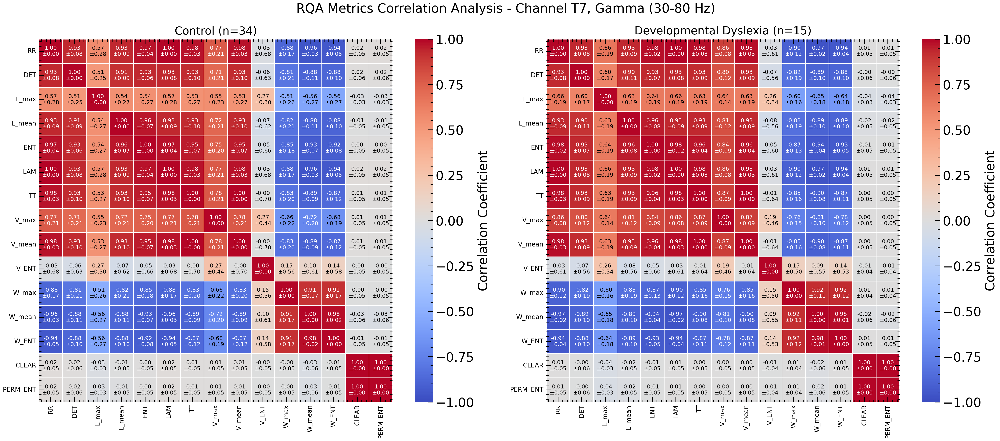

In [12]:
def plot_correlation_heatmaps_side_by_side(data_dict, channel_idx=0, band_idx=0, 
                                          time_window=None, figsize=(18, 8)):
    """
    Plot two side-by-side heatmaps showing correlation matrices with mean ± std annotations.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with keys 'CT' and 'DD' containing data
    channel_idx : int
        Index of the channel to analyze
    band_idx : int
        Index of the frequency band to analyze
    time_window : tuple or None
        Optional time window
    figsize : tuple
        Figure size
    """
    import seaborn as sns
    import matplotlib.pyplot as plt
    
    band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    # Get all metrics
    all_metrics = data_dict["CT"]["rqa_params"].item().get("metrics_to_use", [])
    n_metrics = len(all_metrics)
    
    # Group labels
    group_labels = {"CT": "Control", "DD": "Developmental Dyslexia"}
    
    # Create a figure with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Set a title for the entire figure
    fig.suptitle(f'RQA Metrics Correlation Analysis - Channel T7, {band_names[band_idx]}', 
                fontsize=16)
    
    # Process each group
    for group_idx, (group_name, data) in enumerate(data_dict.items()):
        # Get number of patients
        n_patients = data["rqa_metrics"].shape[0]
        
        # Initialize arrays to store correlation matrices for all patients
        all_corr_matrices = []
        valid_patients = 0
        
        # Process each patient
        for patient_idx in range(n_patients):
            try:
                # Get RQA metrics data for this patient
                rqa_data = data["rqa_metrics"][patient_idx, channel_idx, band_idx, :, :]
                
                # Apply time window if specified
                if time_window is not None:
                    start, end = time_window
                    rqa_data = rqa_data[start:min(end, rqa_data.shape[0]), :]
                
                # Check if we have enough data
                if rqa_data.shape[0] < 5:
                    continue
                
                # Create a DataFrame with all metrics
                df = pd.DataFrame(rqa_data, columns=all_metrics)
                
                # Check for constant columns (which cause NaN correlations)
                const_cols = df.columns[df.nunique() <= 1]
                if len(const_cols) > 0:
                    # Add tiny noise to constant columns
                    for col in const_cols:
                        df[col] = df[col] + np.random.normal(0, 1e-10, size=len(df))
                
                # Calculate correlation matrix
                corr_matrix = df.corr(method="spearman").values
                
                # Check for NaN values
                if np.isnan(corr_matrix).any():
                    # Replace NaNs with zeros
                    corr_matrix = np.nan_to_num(corr_matrix, nan=0.0)
                
                # Store in our list
                all_corr_matrices.append(corr_matrix)
                valid_patients += 1
                
            except Exception as e:
                print(f"Error processing patient {patient_idx} in group {group_name}: {str(e)}")
        
        print(f"Group {group_name}: Processed {valid_patients} valid patients out of {n_patients}")
        
        if valid_patients == 0:
            print(f"No valid data for group {group_name}!")
            # Fill with zeros to avoid errors
            mean_corr = np.zeros((n_metrics, n_metrics))
            std_corr = np.zeros((n_metrics, n_metrics))
        else:
            # Convert list to array
            all_corr_matrices_array = np.array(all_corr_matrices)
            
            # Calculate mean and standard deviation across patients
            mean_corr = np.mean(all_corr_matrices_array, axis=0)
            std_corr = np.std(all_corr_matrices_array, axis=0)
        
        # Create a DataFrame for mean correlation
        mean_df = pd.DataFrame(mean_corr, index=all_metrics, columns=all_metrics)
        
        # Get current axis
        ax = axes[group_idx]
        
        # Plot heatmap
        sns.heatmap(mean_df, ax=ax, cmap='coolwarm', vmin=-1, vmax=1,
                   linewidths=0.5, cbar_kws={'label': 'Correlation Coefficient'})
        
        # Set title
        ax.set_title(f'{group_labels[group_name]} (n={valid_patients})', fontsize=14)
        
        # Adjust labels for better readability
        ax.set_xticklabels(all_metrics, rotation=90, ha='center', fontsize=8)
        ax.set_yticklabels(all_metrics, rotation=0, fontsize=8)
        
        # Add text annotations for mean ± std
        for i in range(n_metrics):
            for j in range(n_metrics):
                # Determine text color for better contrast
                color = 'white' if abs(mean_corr[i, j]) > 0.7 else 'black'
                
                # Create annotation text with mean ± std
                text = f"{mean_corr[i, j]:.2f}\n±{std_corr[i, j]:.2f}"
                
                # Add text annotation
                ax.text(j + 0.5, i + 0.5, text, ha='center', va='center', 
                       color=color, fontsize=7)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        fig.text(0.5, 0.01, f'Time Window: {start} to {end}', ha='center', fontsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, bottom=0.1)
    
    return fig

# Try the side-by-side heatmaps
try:
    print("Creating side-by-side heatmaps...")
    fig = plot_correlation_heatmaps_side_by_side(
        data_dict,
        channel_idx=0,
        band_idx=4,  # Gamma band
    )
    plt.savefig(os.path.join(savepath_assets, 'rqa_correlation_analysis_heatmap.svg'), format='svg', bbox_inches='tight', dpi=300)

    plt.show()
except Exception as e:
    print(f"Error creating side-by-side heatmaps: {str(e)}")

In [ ]:
def plot_correlation_heatmaps_with_significance(data_dict, channel_idx=0, band_idx=0, 
                                               time_window=None, figsize=(20, 9),
                                               n_permutations=1000, alpha=0.05,
                                               save_csv=True, savepath=None):
    """
    Plot side-by-side heatmaps showing correlation matrices with statistical significance testing.
    """
    import seaborn as sns
    import matplotlib.pyplot as plt
    from scipy.stats import spearmanr, permutation_test
    import pandas as pd
    import numpy as np
    import os
    from functools import partial
    
    # Optimization: Define a reusable correlation function for permutation tests
    def spearman_r(x, y):
        return spearmanr(x, y)[0]
        
    band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    # Get all metrics
    all_metrics = data_dict["CT"]["rqa_params"].item().get("metrics_to_use", [])
    n_metrics = len(all_metrics)
    
    # Group labels
    group_labels = {"CT": "Control", "DD": "Developmental Dyslexia"}
    
    # Create a figure with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Set a title for the entire figure
    fig.suptitle(f'RQA Metrics Correlation Analysis - Channel T7, {band_names[band_idx]}', 
                fontsize=16)
    
    # For storing statistical results
    stat_results = {}
    
    # Process each group
    for group_idx, (group_name, data) in enumerate(data_dict.items()):
        # Get number of patients
        n_patients = data["rqa_metrics"].shape[0]
        
        # Initialize arrays to store correlation matrices for all patients
        all_corr_matrices = []
        valid_patients = 0
        
        # Store all metrics data for permutation testing
        all_patient_metrics = {metric: [] for metric in all_metrics}
        
        # Process each patient
        for patient_idx in range(n_patients):
            try:
                # Get RQA metrics data for this patient
                rqa_data = data["rqa_metrics"][patient_idx, channel_idx, band_idx, :, :]
                
                # Apply time window if specified
                if time_window is not None:
                    start, end = time_window
                    rqa_data = rqa_data[start:min(end, rqa_data.shape[0]), :]
                
                # Check if we have enough data
                if rqa_data.shape[0] < 5:
                    continue
                
                # Create a DataFrame with all metrics
                df = pd.DataFrame(rqa_data, columns=all_metrics)
                
                # Check for constant columns (which cause NaN correlations)
                const_cols = df.columns[df.nunique() <= 1]
                if len(const_cols) > 0:
                    # Add tiny noise to constant columns
                    for col in const_cols:
                        df[col] = df[col] + np.random.normal(0, 1e-10, size=len(df))
                
                # Store metrics for this patient
                for metric in all_metrics:
                    all_patient_metrics[metric].append(df[metric].values)
                
                # Calculate correlation matrix
                corr_matrix = df.corr(method="spearman").values
                
                # Check for NaN values
                if np.isnan(corr_matrix).any():
                    # Replace NaNs with zeros
                    corr_matrix = np.nan_to_num(corr_matrix, nan=0.0)
                
                # Store in our list
                all_corr_matrices.append(corr_matrix)
                valid_patients += 1
                
            except Exception as e:
                print(f"Error processing patient {patient_idx} in group {group_name}: {str(e)}")
        
        print(f"Group {group_name}: Processed {valid_patients} valid patients out of {n_patients}")
        
        if valid_patients == 0:
            print(f"No valid data for group {group_name}!")
            # Fill with zeros to avoid errors
            mean_corr = np.zeros((n_metrics, n_metrics))
            std_corr = np.zeros((n_metrics, n_metrics))
            p_values = np.ones((n_metrics, n_metrics))
        else:
            # Convert list to array
            all_corr_matrices_array = np.array(all_corr_matrices)
            
            # Calculate mean and standard deviation across patients
            mean_corr = np.mean(all_corr_matrices_array, axis=0)
            std_corr = np.std(all_corr_matrices_array, axis=0)
            
            # Initialize p-value matrix
            p_values = np.ones((n_metrics, n_metrics))
            
            # Perform statistical testing for each pair of metrics
            for i, metric1 in enumerate(all_metrics):
                for j, metric2 in enumerate(all_metrics):
                    if i != j:  # Skip self-correlations
                        # Collect data across all patients for these two metrics
                        combined_metric1 = np.concatenate([vals for vals in all_patient_metrics[metric1]])
                        combined_metric2 = np.concatenate([vals for vals in all_patient_metrics[metric2]])
                        
                        # Remove any NaN values (paired removal)
                        valid_mask = ~(np.isnan(combined_metric1) | np.isnan(combined_metric2))
                        x = combined_metric1[valid_mask]
                        y = combined_metric2[valid_mask]
                        
                        if len(x) > 10:  # Only test if we have enough data points
                            try:
                                # Use scipy's optimized permutation test
                                res = permutation_test(
                                    (x, y), 
                                    spearman_r, 
                                    n_resamples=n_permutations,
                                    alternative='two-sided',
                                    permutation_type='pairings'
                                )
                                p_values[i, j] = res.pvalue
                            except Exception as e:
                                print(f"Error in permutation test for {metric1}-{metric2}: {e}")
                                p_values[i, j] = 1.0
        
        # Create DataFrames for results
        mean_df = pd.DataFrame(mean_corr, index=all_metrics, columns=all_metrics)
        std_df = pd.DataFrame(std_corr, index=all_metrics, columns=all_metrics)
        p_val_df = pd.DataFrame(p_values, index=all_metrics, columns=all_metrics)
        
        # Store in results dictionary
        stat_results[group_name] = {
            'mean': mean_df,
            'std': std_df,
            'p_values': p_val_df,
            'n_subjects': valid_patients
        }
        
        # Get current axis
        ax = axes[group_idx]
        
        # Plot heatmap
        sns.heatmap(mean_df, ax=ax, cmap='coolwarm', vmin=-1, vmax=1,
                   linewidths=0.5, cbar_kws={'label': 'Correlation Coefficient'})
        
        # Set title
        ax.set_title(f'{group_labels[group_name]} (n={valid_patients})', fontsize=14)
        
        # Adjust labels for better readability
        ax.set_xticklabels(all_metrics, rotation=90, ha='center', fontsize=8)
        ax.set_yticklabels(all_metrics, rotation=0, fontsize=8)
        
        # Add text annotations for mean ± std and significance
        for i in range(n_metrics):
            for j in range(n_metrics):
                # Determine text color for better contrast
                color = 'white' if abs(mean_corr[i, j]) > 0.7 else 'black'
                
                # Add significance markers
                sig_marker = ''
                if i != j:  # Skip self-correlations
                    if p_values[i, j] < 0.001:
                        sig_marker = '***'
                    elif p_values[i, j] < 0.01:
                        sig_marker = '**'
                    elif p_values[i, j] < 0.05:
                        sig_marker = '*'
                
                # Create annotation text with mean ± std and significance marker
                text = f"{mean_corr[i, j]:.2f}\n±{std_corr[i, j]:.2f}{sig_marker}"
                
                # Add text annotation
                ax.text(j + 0.5, i + 0.5, text, ha='center', va='center', 
                       color=color, fontsize=7)
    
    # Add legend for significance markers
    fig.text(0.5, 0.01, 
             '* p < 0.05   ** p < 0.01   *** p < 0.001   (Permutation test, N=' + 
             str(n_permutations) + ' permutations)', 
             ha='center', fontsize=10)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        fig.text(0.5, 0.03, f'Time Window: {start} to {end}', ha='center', fontsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, bottom=0.15)
    
    # Save statistical results to CSV if requested
    if save_csv and savepath is not None:
        for group_name, results in stat_results.items():
            # Create a CSV for correlation values with significance markers
            corr_with_sig = results['mean'].copy()
            
            # Add significance markers
            for i, metric1 in enumerate(all_metrics):
                for j, metric2 in enumerate(all_metrics):
                    if i != j:  # Skip self-correlations
                        p_val = results['p_values'].loc[metric1, metric2]
                        sig_marker = ''
                        if p_val < 0.001:
                            sig_marker = '***'
                        elif p_val < 0.01:
                            sig_marker = '**'
                        elif p_val < 0.05:
                            sig_marker = '*'
                        
                        corr_val = results['mean'].loc[metric1, metric2]
                        std_val = results['std'].loc[metric1, metric2]
                        corr_with_sig.loc[metric1, metric2] = f"{corr_val:.2f}±{std_val:.2f}{sig_marker}"
            
            # Save to CSV
            csv_filename = f"rqa_correlation_stats_{group_name}_channel{channel_idx}_band{band_idx}.csv"
            corr_with_sig.to_csv(os.path.join(savepath, csv_filename))
            
            # Also save raw p-values
            p_val_filename = f"rqa_correlation_pvalues_{group_name}_channel{channel_idx}_band{band_idx}.csv"
            results['p_values'].to_csv(os.path.join(savepath, p_val_filename))
    
    return fig, stat_results

# Use the updated function with permutation testing
try:
    print("Creating heatmaps with statistical significance testing...")
    fig, stat_results = plot_correlation_heatmaps_with_significance(
        data_dict,
        channel_idx=0,
        band_idx=4,  # Gamma band
        n_permutations=1000,  # Number of permutations for statistical testing
        alpha=0.05,  # Significance threshold
        save_csv=True,
        savepath=savepath_assets
    )
    plt.savefig(os.path.join(savepath_assets, 'rqa_correlation_analysis_heatmap_with_significance.svg'), 
                format='svg', bbox_inches='tight', dpi=300)

    plt.show()
    
    print("Statistical testing complete and results saved.")
    
except Exception as e:
    print(f"Error creating heatmaps with significance testing: {str(e)}")
    import traceback
    traceback.print_exc()

Creating heatmaps with statistical significance testing...
Group CT: Processed 34 valid patients out of 34


## PPSore

Creating side-by-side PPS heatmaps...
Group CT: Processed 34 valid patients out of 34
Group DD: Processed 15 valid patients out of 15


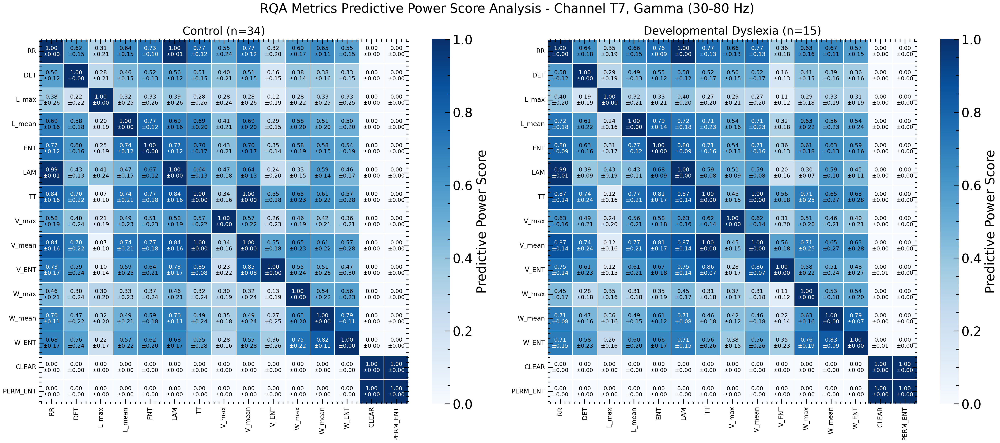

In [10]:
def plot_pps_heatmaps_side_by_side(data_dict, channel_idx=0, band_idx=0, 
                                  time_window=None, figsize=(18, 8)):
    """
    Plot two side-by-side heatmaps showing Predictive Power Score matrices with mean ± std annotations.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with keys 'CT' and 'DD' containing data
    channel_idx : int
        Index of the channel to analyze
    band_idx : int
        Index of the frequency band to analyze
    time_window : tuple or None
        Optional time window
    figsize : tuple
        Figure size
    """
    import seaborn as sns
    import matplotlib.pyplot as plt
    import ppscore as pps
    
    band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    # Get all metrics
    all_metrics = data_dict["CT"]["rqa_params"].item().get("metrics_to_use", [])
    n_metrics = len(all_metrics)
    
    # Group labels
    group_labels = {"CT": "Control", "DD": "Developmental Dyslexia"}
    
    # Create a figure with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Set a title for the entire figure
    fig.suptitle(f'RQA Metrics Predictive Power Score Analysis - Channel T7, {band_names[band_idx]}', 
                fontsize=16)
    
    # Process each group
    for group_idx, (group_name, data) in enumerate(data_dict.items()):
        # Get number of patients
        n_patients = data["rqa_metrics"].shape[0]
        
        # Initialize arrays to store PPS matrices for all patients
        all_pps_matrices = []
        valid_patients = 0
        
        # Process each patient
        for patient_idx in range(n_patients):
            try:
                # Get RQA metrics data for this patient
                rqa_data = data["rqa_metrics"][patient_idx, channel_idx, band_idx, :, :]
                
                # Apply time window if specified
                if time_window is not None:
                    start, end = time_window
                    rqa_data = rqa_data[start:min(end, rqa_data.shape[0]), :]
                
                # Check if we have enough data
                if rqa_data.shape[0] < 5:
                    continue
                
                # Create a DataFrame with all metrics
                df = pd.DataFrame(rqa_data, columns=all_metrics)
                
                # Check for constant columns
                const_cols = df.columns[df.nunique() <= 1]
                if len(const_cols) > 0:
                    # Add tiny noise to constant columns
                    for col in const_cols:
                        df[col] = df[col] + np.random.normal(0, 1e-10, size=len(df))
                
                # Calculate PPS matrix
                pps_matrix_df = pps.matrix(df)
                
                # Convert to a square matrix format
                pps_square = np.zeros((n_metrics, n_metrics))
                for i, x in enumerate(all_metrics):
                    for j, y in enumerate(all_metrics):
                        # Get the PPS score where x predicts y
                        score = pps_matrix_df[(pps_matrix_df['x'] == x) & 
                                             (pps_matrix_df['y'] == y)]['ppscore'].values
                        if len(score) > 0:
                            pps_square[j, i] = score[0]  # Note: indices flipped to match correlation matrix
                
                # Store in our list
                all_pps_matrices.append(pps_square)
                valid_patients += 1
                
            except Exception as e:
                print(f"Error processing patient {patient_idx} in group {group_name}: {str(e)}")
        
        print(f"Group {group_name}: Processed {valid_patients} valid patients out of {n_patients}")
        
        if valid_patients == 0:
            print(f"No valid data for group {group_name}!")
            # Fill with zeros to avoid errors
            mean_pps = np.zeros((n_metrics, n_metrics))
            std_pps = np.zeros((n_metrics, n_metrics))
        else:
            # Convert list to array
            all_pps_matrices_array = np.array(all_pps_matrices)
            
            # Calculate mean and standard deviation across patients
            mean_pps = np.mean(all_pps_matrices_array, axis=0)
            std_pps = np.std(all_pps_matrices_array, axis=0)
        
        # Create a DataFrame for mean PPS
        mean_df = pd.DataFrame(mean_pps, index=all_metrics, columns=all_metrics)
        
        # Get current axis
        ax = axes[group_idx]
        
        # Plot heatmap
        sns.heatmap(mean_df, ax=ax, cmap='Blues', vmin=0, vmax=1,
                   linewidths=0.5, cbar_kws={'label': 'Predictive Power Score'})
        
        # Set title
        ax.set_title(f'{group_labels[group_name]} (n={valid_patients})', fontsize=14)
        
        # Adjust labels for better readability
        ax.set_xticklabels(all_metrics, rotation=90, ha='center', fontsize=8)
        ax.set_yticklabels(all_metrics, rotation=0, fontsize=8)
        
        # Add text annotations for mean ± std
        for i in range(n_metrics):
            for j in range(n_metrics):
                # Determine text color for better contrast
                color = 'white' if mean_pps[i, j] > 0.7 else 'black'
                
                # Create annotation text with mean ± std
                text = f"{mean_pps[i, j]:.2f}\n±{std_pps[i, j]:.2f}"
                
                # Add text annotation
                ax.text(j + 0.5, i + 0.5, text, ha='center', va='center', 
                       color=color, fontsize=7)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        fig.text(0.5, 0.01, f'Time Window: {start} to {end}', ha='center', fontsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, bottom=0.1)
    
    return fig

# Try the side-by-side PPS heatmaps
try:
    print("Creating side-by-side PPS heatmaps...")
    fig = plot_pps_heatmaps_side_by_side(
        data_dict,
        channel_idx=0,
        band_idx=4,  # Gamma band
    )
    plt.savefig(os.path.join(savepath_assets, 'rqa_pps_analysis_heatmap.svg'), format='svg', bbox_inches='tight', dpi=300)

    plt.show()
except Exception as e:
    print(f"Error creating side-by-side PPS heatmaps: {str(e)}")

## Distribution comparison

Creating distribution comparison plots...

Statistical Results:
           p_value p_adjusted effect_size js_divergence
RR             0.0        0.0   -0.052434      0.052944
DET       0.000082   0.000095    0.007156      0.081862
L_max          0.0        0.0   -0.093595      0.458512
L_mean         0.0        0.0   -0.027741      0.078974
ENT            0.0        0.0    0.011967      0.086968
LAM       0.001651   0.001769    0.005692      0.094693
TT             0.0        0.0   -0.051272      0.046107
V_max          0.0        0.0   -0.049679      0.064164
V_mean         0.0        0.0   -0.051272      0.046107
V_ENT          0.0        0.0    0.025952       0.05791
W_max          0.0        0.0    0.053612      0.053115
W_mean         0.0        0.0   -0.015786      0.074298
W_ENT     0.007523   0.007523    0.004835      0.068444
CLEAR          0.0        0.0    0.054722      0.046236
PERM_ENT       0.0        0.0    0.054437      0.046232


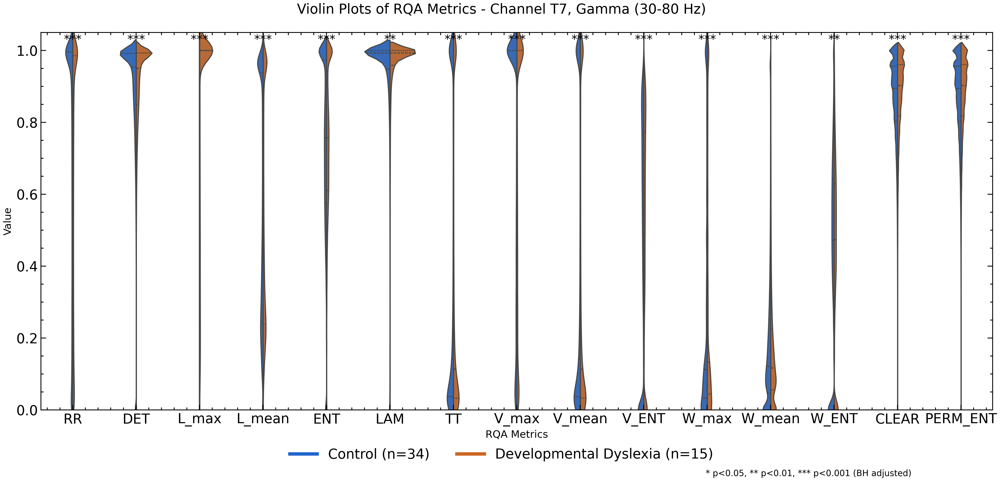

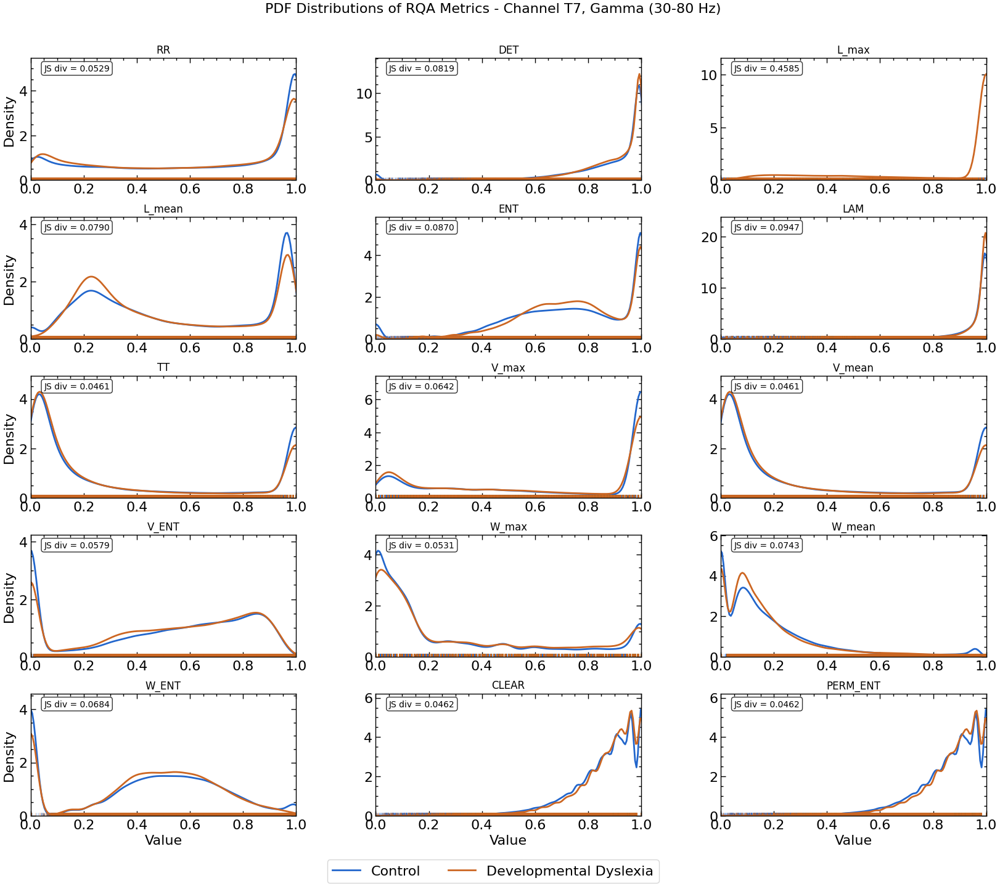

<Figure size 800x600 with 0 Axes>


Statistical Results for RQA Metrics:
Channel: T7, Band: Gamma (30-80 Hz)
--------------------------------------------------------------------------------


,p_value,p_adjusted,effect_size,js_divergence
RR,0.0000,0.0000,-0.0524,0.0529
DET,0.0001,0.0001,0.0072,0.0819
L_max,0.0000,0.0000,-0.0936,0.4585
L_mean,0.0000,0.0000,-0.0277,0.0790
ENT,0.0000,0.0000,0.0120,0.0870
LAM,0.0017,0.0018,0.0057,0.0947
TT,0.0000,0.0000,-0.0513,0.0461
V_max,0.0000,0.0000,-0.0497,0.0642
V_mean,0.0000,0.0000,-0.0513,0.0461
V_ENT,0.0000,0.0000,0.0260,0.0579


In [11]:
def compare_rqa_metrics_distributions(data_dict, metrics_to_compare=None, channel_idx=0, 
                                     band_idx=0, time_window=None, figsize=(20, 15)):
    """
    Compare the distribution of RQA metrics between Control and Dyslexia groups.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with keys 'CT' and 'DD' containing data
    metrics_to_compare : list or None
        List of specific RQA metrics to compare. If None, all metrics are used.
    channel_idx : int
        Index of the channel to analyze
    band_idx : int
        Index of the frequency band to analyze
    time_window : tuple or None
        Optional time window (start, end)
    figsize : tuple
        Figure size
    """
    import seaborn as sns
    import matplotlib.pyplot as plt
    from scipy import stats
    import numpy as np
    import pandas as pd
    from scipy.spatial.distance import jensenshannon
    from statsmodels.stats.multitest import multipletests
    import matplotlib.gridspec as gridspec
    
    # Define group colors and labels
    group_colors = {
        "CT": "#2266CC",  # Blue for control
        "DD": "#CC6622"   # Orange for dyslexia
    }
    group_labels = {"CT": "Control", "DD": "Developmental Dyslexia"}
    
    # Band names
    band_names = [
        "Delta (0.5-4 Hz)",
        "Theta (4-8 Hz)",
        "Alpha (8-12 Hz)",
        "Beta (12-30 Hz)",
        "Gamma (30-80 Hz)",
    ]
    
    # Get all metrics
    all_metrics = data_dict["CT"]["rqa_params"].item().get("metrics_to_use", [])
    
    # Use specified metrics or all metrics
    if metrics_to_compare is None:
        metrics_to_compare = all_metrics
    
    # Validate metrics
    metrics_to_compare = [m for m in metrics_to_compare if m in all_metrics]
    if not metrics_to_compare:
        print("No valid metrics to compare!")
        return
    
    # Number of metrics to compare
    n_metrics = len(metrics_to_compare)
    
    # Extract and organize data
    all_data = []
    
    # Process each group
    for group_name, data in data_dict.items():
        # Get number of patients
        n_patients = data["rqa_metrics"].shape[0]
        
        # Process each patient
        for patient_idx in range(n_patients):
            try:
                # Get RQA metrics data for this patient
                rqa_data = data["rqa_metrics"][patient_idx, channel_idx, band_idx, :, :]
                
                # Apply time window if specified
                if time_window is not None:
                    start, end = time_window
                    rqa_data = rqa_data[start:min(end, rqa_data.shape[0]), :]
                
                # Skip if no data
                if rqa_data.shape[0] == 0:
                    continue
                
                # Create a DataFrame with all metrics
                df = pd.DataFrame(rqa_data, columns=all_metrics)
                
                # Keep only metrics we want to compare
                df = df[metrics_to_compare]
                
                # Add group and patient columns
                df['Group'] = group_name
                df['Patient'] = patient_idx
                
                # Append to our data list
                all_data.append(df)
                
            except Exception as e:
                print(f"Error processing patient {patient_idx} in group {group_name}: {str(e)}")
    
    # Combine all data
    if not all_data:
        print("No valid data for any patient!")
        return
    
    combined_df = pd.concat(all_data, ignore_index=True)
    
    # Create figures
    # 1. PDF distributions - Creating with proper grid and shared axes
    n_rows = int(np.ceil(n_metrics/3))
    n_cols = min(3, n_metrics)
    
    # Create a figure with custom GridSpec
    pdf_fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(n_rows, n_cols)
    pdf_axes = []
    
    for i in range(n_rows):
        for j in range(n_cols):
            idx = i * n_cols + j
            if idx < n_metrics:
                # Create subplot with proper sharing
                ax = plt.subplot(gs[i, j])
                pdf_axes.append(ax)
    
    # 2. Violin plots
    violin_fig, violin_ax = plt.subplots(1, 1, figsize=(figsize[0], figsize[0]/2.5))
    
    # Set titles
    pdf_fig.suptitle(f'PDF Distributions of RQA Metrics - Channel T7, {band_names[band_idx]}', 
                    fontsize=16)
    violin_fig.suptitle(f'Violin Plots of RQA Metrics - Channel T7, {band_names[band_idx]}', 
                      fontsize=16)
    
    # Add time window information if applicable
    if time_window is not None:
        start, end = time_window
        time_txt = f'Time Window: {start} to {end}'
        pdf_fig.text(0.5, 0.01, time_txt, ha='center', fontsize=10)
        violin_fig.text(0.5, 0.01, time_txt, ha='center', fontsize=10)
    
    # Initialize a DataFrame to store statistical results
    stats_df = pd.DataFrame(index=metrics_to_compare, 
                           columns=['p_value', 'p_adjusted', 'effect_size', 'js_divergence'])
    
    # Create a single legend for all KDE plots
    legend_handles = []
    legend_labels = []
    
    # Process each metric
    for idx, metric in enumerate(metrics_to_compare):
        # Skip if this metric has no data
        if metric not in combined_df.columns:
            continue
        
        # Get data for this metric
        metric_data = combined_df.dropna(subset=[metric])
        
        # ---- 1. PDF Distribution ----
        ax = pdf_axes[idx]
        
        # Storage for kde data to compute JS divergence
        kde_values = {}
        
        # Plot KDE for each group
        for group_name in ["CT", "DD"]:
            group_data = metric_data[metric_data['Group'] == group_name][metric]
            
            if len(group_data) > 0:
                # Plot the KDE
                kde = sns.kdeplot(group_data, ax=ax, color=group_colors[group_name], 
                                 label=group_labels[group_name])
                
                # Add rug plot
                sns.rugplot(group_data, ax=ax, color=group_colors[group_name], alpha=0.3)
                
                # Extract KDE values for JS divergence calculation
                line = kde.get_lines()[-1]
                kde_values[group_name] = {
                    'x': line.get_xdata(),
                    'y': line.get_ydata()
                }
                
                # Capture legend handles for the first plot only
                if idx == 0:
                    legend_handles.append(line)
                    legend_labels.append(group_labels[group_name])
        
        # Calculate Jensen-Shannon divergence if we have data for both groups
        js_div = np.nan
        if 'CT' in kde_values and 'DD' in kde_values:
            # Ensure both distributions are evaluated at the same x points
            # by interpolating to a common grid
            min_x = max(min(kde_values['CT']['x']), min(kde_values['DD']['x']))
            max_x = min(max(kde_values['CT']['x']), max(kde_values['DD']['x']))
            
            # Create a common x grid
            common_x = np.linspace(min_x, max_x, 1000)
            
            # Interpolate y values
            from scipy.interpolate import interp1d
            ct_interp = interp1d(kde_values['CT']['x'], kde_values['CT']['y'], 
                                bounds_error=False, fill_value=0)
            dd_interp = interp1d(kde_values['DD']['x'], kde_values['DD']['y'], 
                                bounds_error=False, fill_value=0)
            
            ct_y = ct_interp(common_x)
            dd_y = dd_interp(common_x)
            
            # Normalize to get proper probability distributions
            ct_y = ct_y / np.sum(ct_y)
            dd_y = dd_y / np.sum(dd_y)
            
            # Calculate JS divergence
            js_div = jensenshannon(ct_y, dd_y)
            
            # Add JS divergence to the plot
            js_text = f"JS div = {js_div:.4f}"
            ax.text(0.05, 0.95, js_text, transform=ax.transAxes, 
                   verticalalignment='top', fontsize=10,
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        # Set title and labels
        ax.set_title(f'{metric}', fontsize=12)
        
        # Only add x labels to the bottom row
        if idx >= n_metrics - n_cols:
            ax.set_xlabel('Value')
        else:
            ax.set_xlabel('')
            
        # Only add y labels to the leftmost column
        if idx % n_cols == 0:
            ax.set_ylabel('Density')
        else:
            ax.set_ylabel('')
        
        # Set x-limits to 0-1 since metrics are normalized
        ax.set_xlim(0, 1)
        
        # Remove individual legends
        ax.get_legend().remove() if ax.get_legend() else None
        
        # Compute statistical tests and effect size
        ct_data = metric_data[metric_data['Group'] == 'CT'][metric]
        dd_data = metric_data[metric_data['Group'] == 'DD'][metric]
        
        if len(ct_data) > 0 and len(dd_data) > 0:
            # Perform Mann-Whitney U test
            u_stat, p_value = stats.mannwhitneyu(ct_data, dd_data, alternative='two-sided')
            
            # Calculate Rank-biserial correlation (effect size)
            n1, n2 = len(ct_data), len(dd_data)
            effect_size = 1 - (2 * u_stat) / (n1 * n2)
            
            # Store results
            stats_df.loc[metric, 'p_value'] = p_value
            stats_df.loc[metric, 'effect_size'] = effect_size
            stats_df.loc[metric, 'js_divergence'] = js_div
    
    # Add a single legend at the bottom of the KDE figure
    pdf_fig.legend(
        handles=legend_handles, 
        labels=legend_labels, 
        loc='lower center',
        ncol=2, 
        bbox_to_anchor=(0.5, 0.02),
        frameon=True
    )
    
    # Apply Benjamini-Hochberg correction to p-values
    if not stats_df['p_value'].isna().all():
        # Get valid p-values (not NaN)
        valid_mask = ~stats_df['p_value'].isna()
        valid_metrics = stats_df.index[valid_mask].tolist()
        
        if valid_metrics:
            # Extract p-values for valid metrics
            p_values = stats_df.loc[valid_metrics, 'p_value'].values
            
            # Apply Benjamini-Hochberg procedure
            rejected, p_corrected, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')
            
            # Store corrected p-values
            stats_df.loc[valid_metrics, 'p_adjusted'] = p_corrected
    
    # ---- 2. Violin Plot ----
    # Prepare data for violin plot (melt to long format)
    violin_data = combined_df.melt(id_vars=['Group', 'Patient'], 
                                 value_vars=metrics_to_compare,
                                 var_name='Metric', value_name='Value')
    
    # Make sure the hue order is consistent to ensure correct colors
    sns.violinplot(
        data=violin_data, 
        x='Metric', 
        y='Value', 
        hue='Group', 
        split=True, 
        inner='quart', 
        palette=group_colors, 
        hue_order=['CT', 'DD'],  # Ensure correct order
        ax=violin_ax
    )
    
    # Add statistical significance markers based on adjusted p-values
    for idx, metric in enumerate(metrics_to_compare):
        if pd.notna(stats_df.loc[metric, 'p_adjusted']):
            p_adjusted = stats_df.loc[metric, 'p_adjusted']
            
            # Add significance markers
            if p_adjusted < 0.05:
                markers = '*'
                if p_adjusted < 0.01:
                    markers += '*'
                if p_adjusted < 0.001:
                    markers += '*'
                
                violin_ax.text(idx, 1.02, markers, ha='center', fontsize=14)
    
    # Adjust violin plot aesthetics
    violin_ax.set_xlabel('RQA Metrics', fontsize=12)
    violin_ax.set_ylabel('Value', fontsize=12)
    violin_ax.set_ylim(0, 1.05)  # Add space for significance markers
    
    # Move the legend to the bottom and outside the plot
    ct_count = len(combined_df[combined_df['Group'] == 'CT']['Patient'].unique())
    dd_count = len(combined_df[combined_df['Group'] == 'DD']['Patient'].unique())
    
    # Create legend with counts
    legend_labels = [f"{group_labels['CT']} (n={ct_count})", f"{group_labels['DD']} (n={dd_count})"]
    
    # First remove existing legend
    violin_ax.get_legend().remove()
    
    # Then add a new legend at the bottom
    violin_fig.legend(
        handles=[
            plt.Line2D([0], [0], color=group_colors['CT'], lw=4),
            plt.Line2D([0], [0], color=group_colors['DD'], lw=4)
        ],
        labels=legend_labels,
        loc='lower center', 
        ncol=2,
        bbox_to_anchor=(0.5, 0.02)
    )
    
    # Add explanation of significance markers next to the legend
    violin_fig.text(0.75, 0.02, "* p<0.05, ** p<0.01, *** p<0.001 (BH adjusted)", 
                  fontsize=10, ha='center', va='center')
    
    # Adjust layouts to make room for legends
    pdf_fig.subplots_adjust(top=0.92, bottom=0.1, hspace=0.3, wspace=0.3)
    violin_fig.subplots_adjust(top=0.92, bottom=0.15)
    
    # Make all KDE plots share the same x axis
    # Set all x-axes to the same limits
    for ax in pdf_axes:
        ax.set_xlim(0, 1)
    
    # Print statistical results
    print("\nStatistical Results:")
    print("=" * 80)
    print(stats_df.round(4))
    
    return pdf_fig, violin_fig, stats_df
# Example usage
try:
    # List of specific RQA metrics to compare
    time_window=None
    print("Creating distribution comparison plots...")
    pdf_fig, violin_fig, stats_df = compare_rqa_metrics_distributions(
        data_dict,
        metrics_to_compare=metrics_to_use,
        channel_idx=0,
        band_idx=4,  # Gamma band
        time_window=time_window
    )
    
    # Save the KDE figure
    plt.figure(pdf_fig.number)
    
    # Set DPI for screen display
    plt.figure(pdf_fig.number).set_dpi(100)
    
    # Optimize SVG for lighter file size
    plt.rcParams['svg.fonttype'] = 'none'  # Embed fonts as text, not paths
    plt.rcParams['svg.hashsalt'] = None    # Reproducible output
    
    # Save the figure - use "tight" bounding box, compress with lower precision
    pdf_fig.savefig(
        os.path.join(savepath_assets, 'kde_exploration_rqa_metrics_ct_dd.png'), 
        format='png', 
        bbox_inches='tight',
    )
    
    plt.show()
    
    # Save the violin figure
    plt.figure(violin_fig.number)
    
    # Set DPI for screen display
    plt.figure(violin_fig.number).set_dpi(100)
    
    # Save the figure with the same optimization settings
    violin_fig.savefig(
        os.path.join(savepath_assets, 'violin_plot_rqa_metrics_ct_dd.svg'), 
        format='svg', 
        bbox_inches='tight',
        dpi=100,
    )
    
    plt.show()
    
    # Display statistical results in a nice format
    print("\nStatistical Results for RQA Metrics:")
    print("=" * 80)
    print(f"Channel: T7, Band: Gamma (30-80 Hz)")
    if time_window is not None:
        print(f"Time Window: {time_window[0]} to {time_window[1]}")
    print("-" * 80)
    
    # Format the table for better display
    styled_df = stats_df.style.format({
        'p_value': '{:.4f}',
        'p_adjusted': '{:.4f}',
        'effect_size': '{:.4f}',
        'js_divergence': '{:.4f}'
    }).background_gradient(subset=['effect_size'], cmap='coolwarm')
    
    # Highlight significant results after correction
    def highlight_significant(s):
        is_pval = s.name == 'p_adjusted'
        return ['background-color: #a8f0a8' if (is_pval and v < 0.05) else '' for v in s]
    
    styled_df = styled_df.apply(highlight_significant, axis=0)
    
    display(styled_df)
    
    # Also save the stats as a CSV for reference
    stats_df.to_csv(os.path.join(savepath_assets, 'rqa_metrics_statistics.csv'))
    
except Exception as e:
    print(f"Error creating distribution plots: {str(e)}")

Results show that differences between DD and CT are statistically reliable (p very small), but the effect sizes (rank‐biserial correlation) are small, indicating that while consistent, the actual distribution shift is subtle.